[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/repos-especializacion-UdeA/trabajo-final_AA1/blob/main/notebooks_pasos_previos/00_preprocesamiento_dataset_clasificacion.ipynb)



# EDA preliminar de los datos preprocesados unificados

## Objetivo a desarrollar

To do...

## Actividades

En este notebook se va a intentar realizar las siguientes tareas relacionadas con la EDA simple:
- [x] Descripción general (número de sujetos, número de gestos, número de canales EMG, número de muestras por sujeto).
- [x] Conteo de posturas (Para ver que tan balanceados estan los datos).
- [x] Grafica de señales sEMG.
- [x] Distribución estadistica por canal (Media, varianza, mínimo, máximo).
- [x] Histograma EMG por canal

## 1. Librerias y configuraciones previas


In [1]:
# Verificacion de librerias necesarias antes de empezar
try:
    import scipy.io
    print("La librería 'scipy' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'scipy' no está instalada.")
    print("Instalando 'scipy'...")
    !pip install scipy

try:
    import libemg
    print("La librería 'libEMG' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'libEMG' no está instalada.")
    print("Instalando 'libEMG'...")
    !pip install libemg

try:
    import imblearn
    print("La librería 'imblearn' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'imblearn' no está instalada.")
    print("Instalando 'imblearn'...")
    !pip install imblearn

try:
    import mlflow
    print("La librería 'mlflow' está instalada y se ha importado correctamente.")
except ImportError:
    print("La librería 'mlflow' no está instalada.")
    print("Instalando 'mlflow'...")
    !pip install mlflow

La librería 'scipy' está instalada y se ha importado correctamente.
La librería 'libEMG' está instalada y se ha importado correctamente.
La librería 'imblearn' está instalada y se ha importado correctamente.
La librería 'mlflow' está instalada y se ha importado correctamente.


In [2]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np

# Almacenar en caché los resultados de funciones en el disco
# ==============================================================================
import joblib


# Gestion de librerias
# ==============================================================================
from importlib import reload

# Matemáticas y estadísticas
# ==============================================================================
import math

# Preparación de datos
# ==============================================================================
from imblearn.over_sampling import RandomOverSampler
from sklearn.neighbors import LocalOutlierFactor

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns


# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

# Formateo y estilo
# ==============================================================================
from IPython.display import Markdown, display

# Biblioteca scipy y componentes
# ==============================================================================
import scipy.io
from scipy import signal


In [4]:
import requests
from tqdm import tqdm
import os
import zipfile
import sys

In [3]:
from libemg.data_handler import OfflineDataHandler, RegexFilter
from libemg.utils import get_windows
from libemg.feature_extractor import FeatureExtractor
from libemg import filtering

## 2. Funciones

In [5]:
#reload(utils.funciones)

# Funciones externas
# ==============================================================================
# from utils.funciones1 import multiple_plot
# from utils.funciones2 import test_hola, graficar_medida, graficar_medida2, filter_signal, \
#                             segmentar_data_base, aplanar_data_base, aplanar_ventana, \
#                             rms_value, mav_value, features_data_base

def find_value_ranges(arr, value):
    """
    Encuentra los rangos (inicio, fin) donde el valor dado aparece de forma continua en un array.

    Parámetros:
        arr (array-like): arreglo de entrada (lista o np.array).
        value (int o float): valor objetivo para encontrar bloques contiguos.

    Retorna:
        List[Tuple[int, int]]: lista de tuplas (inicio, fin) donde aparecen bloques del valor.
    """
    arr = np.asarray(arr)
    ranges = []
    in_range = False

    for i, val in enumerate(arr):
        if val == value and not in_range:
            start = i
            in_range = True
        elif val != value and in_range:
            end = i - 1
            ranges.append((start, end))
            in_range = False

    # Si termina en un bloque del valor
    if in_range:
        ranges.append((start, len(arr) - 1))

    return ranges

## 3. Carga y preprocesamiento del dataset original

Configuración inicial

In [6]:
# Agregar el directorio raíz del proyecto al PYTHONPATH
ROOT_DIR = os.path.abspath(os.path.join(os.getcwd(), '..'))  # Sube un nivel
if ROOT_DIR not in sys.path:
    sys.path.append(ROOT_DIR)
print(f"Directorio raíz del proyecto agregado al PYTHONPATH: {ROOT_DIR}")

Directorio raíz del proyecto agregado al PYTHONPATH: c:\Users\Usuario\Documents\UdeA\especializacion\repos\monografia


In [7]:
# se importan las rutas
# from globals import SRC_DIR, DATA_DIR, RAW_DATA_DIR, PROCESSED_DATA_DIR
# Agregar el directorio SRC_DIR al PYTHONPATH
#if SRC_DIR not in sys.path:
#    sys.path.append(SRC_DIR)
from globals import PREPROCESSED_SUBSET_DATA_DIR
print(f"Ruta de subconjunto de datos filtrados: {PREPROCESSED_SUBSET_DATA_DIR}")

Ruta de subconjunto de datos filtrados: c:\Users\Usuario\Documents\UdeA\especializacion\repos\monografia\data\preprocessed_subset


### Formato de los datos

En nuestro analisis, solo nos va a interesar los datos de las columnas:
* **`emg`**: Señales EMG superficiales tomadas de los 10 electronos.
* **`rerepetition`**: Repetición de la postura de la mano (ejercicio) realizado. Cada postura se repetira 10 veces.
* **`restimulus`**: Postura manual (ejercicio) realizada.

Es importante anotar que los datos cargados son matrices cuyas columnas se relacionan con la información de la siguiente forma:

```
[ emg | restimulus | rerepetition ] = [ 0:9 | 10 | 11 ]
```

### Carga de datos y combinación de los datos

Los datos de cada sujeto se cargan y combianan en el diccionario `raw_data`

In [8]:
# Listar y cargar los archivos .npy del directorio PROCESSED_DATA_DIR
npy_files = [f for f in os.listdir(PREPROCESSED_SUBSET_DATA_DIR) if f.endswith('.npy')]

filtered_data = {}
for file in npy_files:
    file_path = os.path.join(PREPROCESSED_SUBSET_DATA_DIR, file)
    sub_i = file.split('_s')[-1].split('.')[0]
    sub_i = sub_i.split('_')[0]
    filtered_data[sub_i] = np.load(file_path)
    print(f"Archivo cargado: {file}")

Archivo cargado: preprocessed_subset_s10_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s11_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s12_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s13_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s14_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s15_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s16_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s17_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s18_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s19_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s1_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s20_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s21_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s22_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s23_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s24_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s25_p1_23_E3.npy
Archivo cargado: preprocessed_subset_s26_p1_23_E3.npy
Archivo cargado: preprocessed

Se realiza la ejecición de algunos comandos de inspección:

In [9]:
len(filtered_data)  # Mostrar la cantidad de archivos cargados

27

In [10]:
filtered_data['1'].shape

(16036, 12)

Según lo anterior, al parecer la carga de datos parece correcta.

Nuevamente, vamos a realizar una inspección visual de los datos cargados usando un sujeto como muestra (sujeto 1)

```
[ emg | restimulus | rerepetition ] = [ 0:9 | 10 | 11 ]
```

* **`restimulus`**: 1 - 23 (El reposo se toma como 0)
* **`rerepetition`**: 1 - 10

In [12]:
INDEX_SUB = '1'
emg_s1 = filtered_data[INDEX_SUB][:,0:10]
restimulus_s1 = filtered_data[INDEX_SUB][:,10]
rerepetition_s1 = filtered_data[INDEX_SUB][:,11]

Vamos a graficar todas los ejercicios para el usuario seleccionado

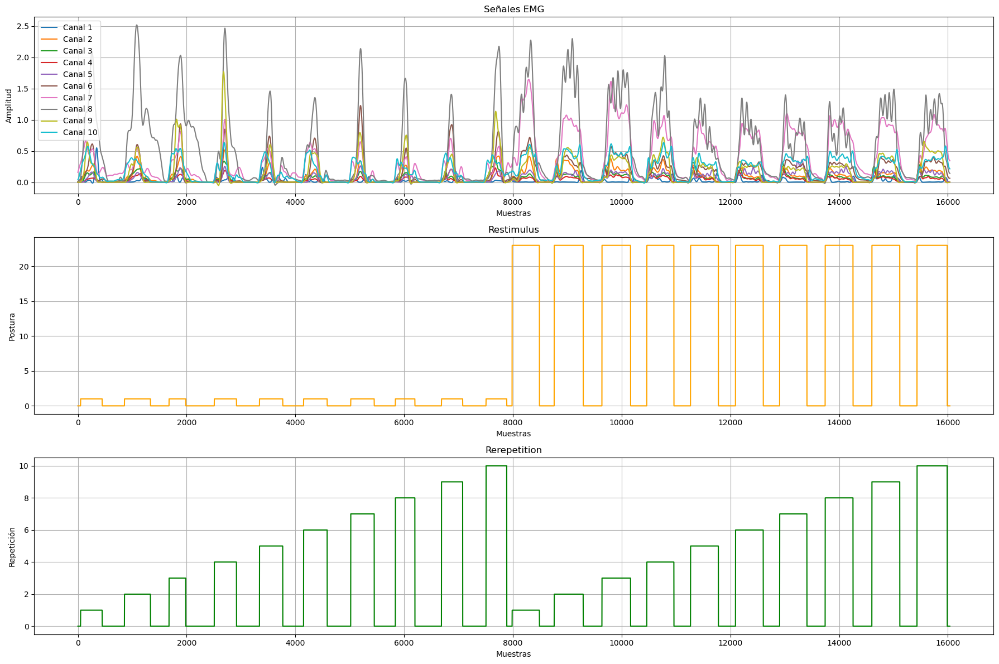

In [13]:
plt.figure(figsize=(18, 12))

# Subplot 1: EMG signals
plt.subplot(3, 1, 1)
for i in range(emg_s1.shape[1]):  # Iterate over each EMG channel
    plt.plot(emg_s1[:, i], label=f'Canal {i+1}')
plt.title('Señales EMG')
plt.xlabel('Muestras')
plt.ylabel('Amplitud')
plt.legend()
plt.grid(True)

# Subplot 2: Restimulus
plt.subplot(3, 1, 2)
plt.plot(restimulus_s1, color='orange')
plt.title('Restimulus')
plt.xlabel('Muestras')
plt.ylabel('Postura')
plt.grid(True)

# Subplot 3: Rerepetition
plt.subplot(3, 1, 3)
plt.plot(rerepetition_s1, color='green')
plt.title('Rerepetition')
plt.xlabel('Muestras')
plt.ylabel('Repetición')
plt.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [14]:
filtered_data[INDEX_SUB].shape  # Mostrar la forma de los datos cargados

(16036, 12)

## 3. EDA basico

### Concatenación de todos los datos en un unico dataframe

Se pasan todos los datos del diccionario en el que se cargaron los datos  (`raw_data`) a un unica matriz para facilitar la analitica de estos. Esta matriz tendra como primera columna el numero del sujeto, las columnas de esta matriz seran:


```
[ subject | emg | restimulus | rerepetition ] = [ 0 | 1:10 | 11 | 12 ]
```

In [16]:
def concatenar_matrices_con_clave(diccionario_matrices):
    """
    Concatena verticalmente las matrices en un diccionario, 
    agregando una columna a la izquierda con el valor entero de la clave asociada a cada matriz.

    Parámetros:
    diccionario_matrices (dict): Diccionario cuyas claves son cadenas de dígitos ('1', '2', ...) 
                                  y cuyos valores son matrices numpy de igual número de columnas.

    Retorna:
    numpy.ndarray: Una única matriz numpy con una columna adicional al principio que identifica la clave original.
    """
    matrices_modificadas = []

    for k, matriz in diccionario_matrices.items():
        clave_int = int(k)
        n_filas = matriz.shape[0]
        columna_clave = np.full((n_filas, 1), clave_int)
        matriz_modificada = np.hstack((columna_clave, matriz))
        matrices_modificadas.append(matriz_modificada)

    return np.concatenate(matrices_modificadas, axis=0)

Invocación de la función

In [17]:
all_users_filtered_data = concatenar_matrices_con_clave(filtered_data)
all_users_filtered_data.shape  # Mostrar la forma de los datos concatenados

(432383, 13)

Se seleccinan de manera aleatoria 5 muestras para verificar consistencia de la matrix:

In [19]:
# Seleccionar una muestra aleatoria de 20 filas
SAMPLES = 5
sample_data = all_users_filtered_data[np.random.choice(all_users_filtered_data.shape[0], SAMPLES, replace=False)]

# Mostrar la muestra seleccionada
print(sample_data)

[[ 2.30000000e+01  2.45958315e-03  2.00040280e-01 -5.43453985e-04
  -4.80094407e-03  2.04688241e-03  1.02364039e-02  3.05295169e-01
   5.15587548e-01  1.06399690e-01  1.93926658e-01  0.00000000e+00
   0.00000000e+00]
 [ 2.10000000e+01  2.00389156e+00  5.47994743e-01  1.97442383e-01
   1.33921745e-01  7.35517222e-02  1.48967386e-01  1.11189013e+00
   1.61385021e+00  1.64407771e+00  2.48084393e-01  2.30000000e+01
   9.00000000e+00]
 [ 4.00000000e+00  9.85361810e-03  1.67013236e-01  1.74875406e-03
   2.42874071e-03  2.42277539e-03  2.23365996e-03  2.45236904e-02
   7.70074525e-02  2.76937177e-03  1.53720050e-01  0.00000000e+00
   0.00000000e+00]
 [ 1.80000000e+01  3.38189189e-03  3.13682562e-03  4.12285171e-03
   3.72336123e-03  4.32285612e-03  6.22249986e-03  2.32175325e-01
   4.57281415e-03  3.08936004e-03  2.05277352e-02  0.00000000e+00
   0.00000000e+00]
 [ 1.20000000e+01  6.28633132e-01  2.93056300e-02  4.77591188e-03
   7.97460016e-03  3.06591049e-03  1.91977444e-02  4.43252845e-02


Al parecer, la salida tiene sentido de modo que se puede proceder con la creación del dataframe `df_all_users` a partir de la matriz `all_users_raw_data`

In [20]:
# Crear un DataFrame a partir de all_users_raw_data
columns = ['subject'] + [f'emg_{i}' for i in range(1, 11)] + ['restimulus', 'rerepetition']
df_all_users = pd.DataFrame(all_users_filtered_data, columns=columns)

# Mostrar las primeras filas del DataFrame
df_all_users.head()

,subject,emg_1,emg_2,emg_3,emg_4,emg_5,emg_6,emg_7,emg_8,emg_9,emg_10,restimulus,rerepetition
0,10.0,0.247590,0.101654,-0.004054,0.002397,0.002365,0.002183,-0.005319,-0.027150,0.002326,-0.021768,0.0,0.0
1,10.0,0.242329,0.098765,-0.004391,0.002396,0.002362,0.002181,-0.005193,-0.027887,0.002318,-0.022504,0.0,0.0
2,10.0,0.237068,0.095835,-0.004730,0.002395,0.002359,0.002180,-0.005026,-0.028523,0.002309,-0.023206,0.0,0.0
3,10.0,0.231825,0.092875,-0.005072,0.002394,0.002356,0.002179,-0.004812,-0.029049,0.002300,-0.023867,0.0,0.0
4,10.0,0.226615,0.089892,-0.005416,0.002392,0.002353,0.002180,-0.004550,-0.029451,0.002291,-0.024482,0.0,0.0


### Descripción general del dataframe



#### Inspección inicial y conversiones previas

In [21]:
df_all_users.shape  # Mostrar la forma de los datos concatenados

(432383, 13)

In [22]:
df_all_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 432383 entries, 0 to 432382
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   subject       432383 non-null  float64
 1   emg_1         432383 non-null  float64
 2   emg_2         432383 non-null  float64
 3   emg_3         432383 non-null  float64
 4   emg_4         432383 non-null  float64
 5   emg_5         432383 non-null  float64
 6   emg_6         432383 non-null  float64
 7   emg_7         432383 non-null  float64
 8   emg_8         432383 non-null  float64
 9   emg_9         432383 non-null  float64
 10  emg_10        432383 non-null  float64
 11  restimulus    432383 non-null  float64
 12  rerepetition  432383 non-null  float64
dtypes: float64(13)
memory usage: 42.9 MB


Como hay columnas que tienen que ver con datos categoricos y el dataframe original tiene todos los datos numericos, se hace la conversión de las columnas categoricas cargadas como numericas a datos categoricos.

In [23]:
# Convertir las columnas en categóricas
df_all_users['subject'] = df_all_users['subject'].astype('category')
df_all_users['restimulus'] = df_all_users['restimulus'].astype('category')
df_all_users['rerepetition'] = df_all_users['rerepetition'].astype('category')

# Verificar los cambios
df_all_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 432383 entries, 0 to 432382
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   subject       432383 non-null  category
 1   emg_1         432383 non-null  float64 
 2   emg_2         432383 non-null  float64 
 3   emg_3         432383 non-null  float64 
 4   emg_4         432383 non-null  float64 
 5   emg_5         432383 non-null  float64 
 6   emg_6         432383 non-null  float64 
 7   emg_7         432383 non-null  float64 
 8   emg_8         432383 non-null  float64 
 9   emg_9         432383 non-null  float64 
 10  emg_10        432383 non-null  float64 
 11  restimulus    432383 non-null  category
 12  rerepetition  432383 non-null  category
dtypes: category(3), float64(10)
memory usage: 34.2 MB


#### Información general del dataframe 

##### Datos categoricos

In [24]:
df_all_users.describe(include='category')

,subject,restimulus,rerepetition
count,432383.0,432383.0,432383.0
unique,27.0,3.0,11.0
top,5.0,0.0,0.0
freq,16154.0,212160.0,212160.0


In [25]:
df_all_users['subject'].value_counts().sort_index()


subject
1.0     16036
2.0     15973
3.0     15956
4.0     16000
5.0     16154
6.0     16069
7.0     15955
8.0     16056
9.0     16120
10.0    15988
11.0    16099
12.0    15930
13.0    16007
14.0    15864
15.0    15937
16.0    16001
17.0    16034
18.0    15985
19.0    16116
20.0    15972
21.0    16109
22.0    16003
23.0    15901
24.0    16055
25.0    16013
26.0    16150
27.0    15900
Name: count, dtype: int64

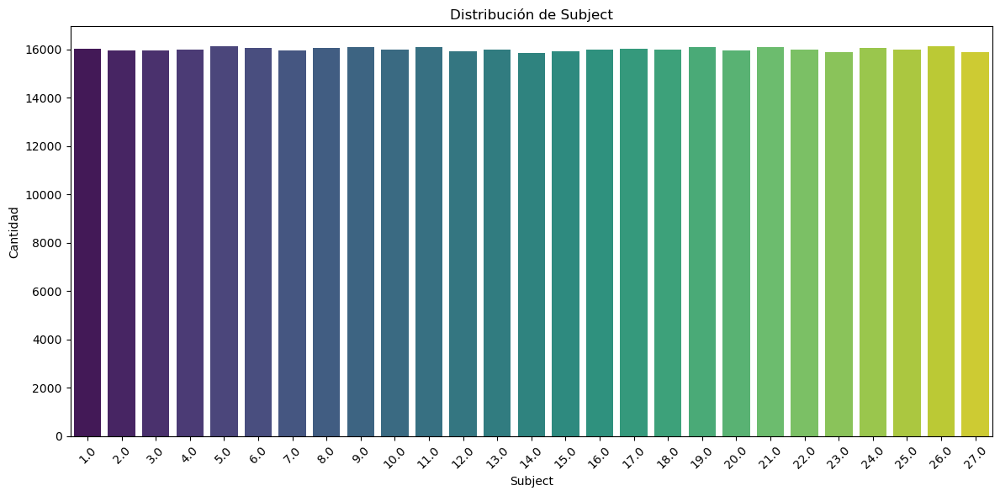

In [26]:
# Configuración de la figura
plt.figure(figsize=(12, 6))

# Crear el countplot para la columna 'subject'
sns.countplot(data=df_all_users, x='subject', order=df_all_users['subject'].cat.categories, palette='viridis')

# Configuración de títulos y etiquetas
plt.title('Distribución de Subject')
plt.xlabel('Subject')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

In [27]:
df_all_users['restimulus'].value_counts().sort_index()

restimulus
0.0     212160
1.0      96108
23.0    124115
Name: count, dtype: int64

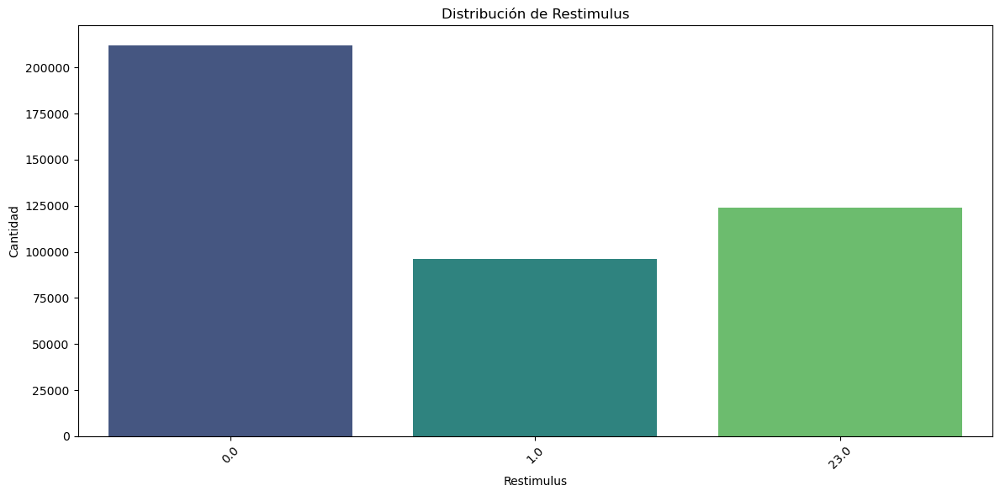

In [28]:
# Configuración de la figura
plt.figure(figsize=(12, 6))

# Crear el countplot para la columna 'restimulus'
sns.countplot(data=df_all_users, x='restimulus', order=df_all_users['restimulus'].cat.categories, palette='viridis')

# Configuración de títulos y etiquetas
plt.title('Distribución de Restimulus')
plt.xlabel('Restimulus')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

In [29]:
df_all_users['rerepetition'].value_counts().sort_index()

rerepetition
0.0     212160
1.0      21965
2.0      21704
3.0      21916
4.0      21418
5.0      21962
6.0      22416
7.0      22148
8.0      22330
9.0      22529
10.0     21835
Name: count, dtype: int64

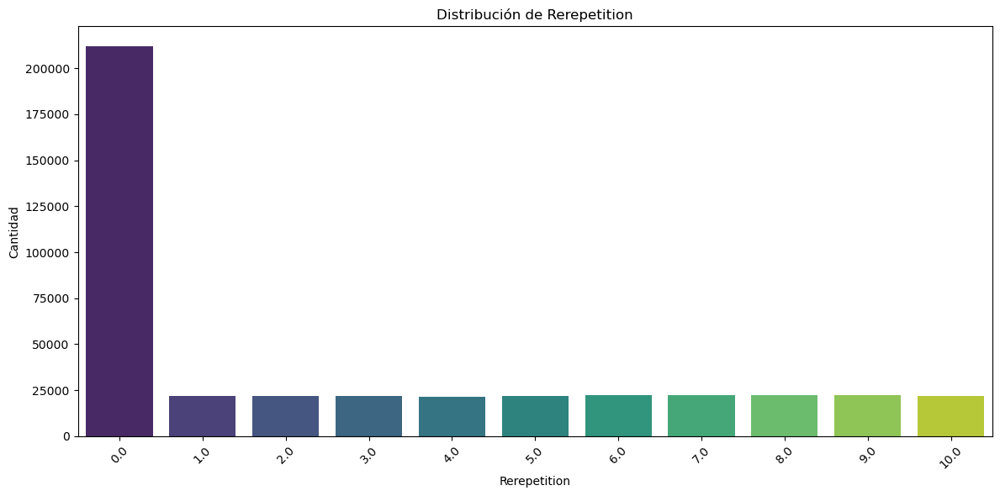

In [30]:
# Configuración de la figura
plt.figure(figsize=(12, 6))

# Crear el countplot para la columna 'rerepetition'
sns.countplot(data=df_all_users, x='rerepetition', order=df_all_users['rerepetition'].cat.categories, palette='viridis')

# Configuración de títulos y etiquetas
plt.title('Distribución de Rerepetition')
plt.xlabel('Rerepetition')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

##### Datos numericos

In [31]:
df_all_users.head(5)

,subject,emg_1,emg_2,emg_3,emg_4,emg_5,emg_6,emg_7,emg_8,emg_9,emg_10,restimulus,rerepetition
0,10.0,0.247590,0.101654,-0.004054,0.002397,0.002365,0.002183,-0.005319,-0.027150,0.002326,-0.021768,0.0,0.0
1,10.0,0.242329,0.098765,-0.004391,0.002396,0.002362,0.002181,-0.005193,-0.027887,0.002318,-0.022504,0.0,0.0
2,10.0,0.237068,0.095835,-0.004730,0.002395,0.002359,0.002180,-0.005026,-0.028523,0.002309,-0.023206,0.0,0.0
3,10.0,0.231825,0.092875,-0.005072,0.002394,0.002356,0.002179,-0.004812,-0.029049,0.002300,-0.023867,0.0,0.0
4,10.0,0.226615,0.089892,-0.005416,0.002392,0.002353,0.002180,-0.004550,-0.029451,0.002291,-0.024482,0.0,0.0


Los datos numericos estan relacionados con las señales de electromiografia superficial

In [32]:
df_all_users.iloc[:5, :11]

,subject,emg_1,emg_2,emg_3,emg_4,emg_5,emg_6,emg_7,emg_8,emg_9,emg_10
0,10.0,0.247590,0.101654,-0.004054,0.002397,0.002365,0.002183,-0.005319,-0.027150,0.002326,-0.021768
1,10.0,0.242329,0.098765,-0.004391,0.002396,0.002362,0.002181,-0.005193,-0.027887,0.002318,-0.022504
2,10.0,0.237068,0.095835,-0.004730,0.002395,0.002359,0.002180,-0.005026,-0.028523,0.002309,-0.023206
3,10.0,0.231825,0.092875,-0.005072,0.002394,0.002356,0.002179,-0.004812,-0.029049,0.002300,-0.023867
4,10.0,0.226615,0.089892,-0.005416,0.002392,0.002353,0.002180,-0.004550,-0.029451,0.002291,-0.024482


A continuación, se muestra el resumen estadistico de los EMG:

In [33]:
df_all_users.describe()

,emg_1,emg_2,emg_3,emg_4,emg_5,emg_6,emg_7,emg_8,emg_9,emg_10
count,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000,432383.000000
mean,0.324302,0.186027,0.147287,0.069172,0.033427,0.108519,0.383971,0.478817,0.149371,0.252940
std,0.468648,0.290232,0.255254,0.189921,0.068019,0.250389,0.537598,0.555487,0.272256,0.376846
min,-0.072580,-0.081921,-0.069316,-0.055890,-0.016198,-0.024596,-0.086409,-0.109474,-0.070686,-0.076783
25%,0.005641,0.002666,0.002546,0.002409,0.002510,0.003824,0.050133,0.081288,0.002440,0.036958
50%,0.100700,0.054513,0.017344,0.003618,0.004409,0.030889,0.183522,0.271427,0.029626,0.136433
75%,0.467643,0.272706,0.191389,0.057228,0.031765,0.107037,0.498687,0.699971,0.186362,0.312937
max,3.630833,4.297887,2.665272,3.529637,0.826015,3.366843,4.724230,4.380246,3.316545,4.301807


Ahora se procede a realizar cada una de las graficas por sujeto

In [35]:
numerical_columns = df_all_users.select_dtypes(include=['float64']).columns.tolist()
print(numerical_columns)

['emg_1', 'emg_2', 'emg_3', 'emg_4', 'emg_5', 'emg_6', 'emg_7', 'emg_8', 'emg_9', 'emg_10']


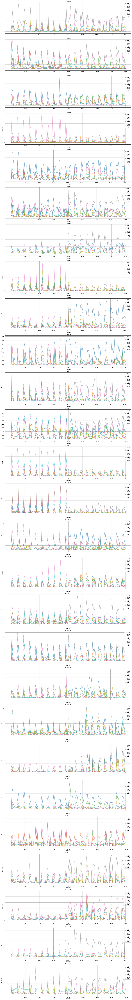

In [36]:
# Configuración de la figura
plt.figure(figsize=(18, len(df_all_users['subject'].cat.categories) * 5))  # Ajustar la altura para mayor claridad

# Iterar sobre cada sujeto y graficar sus señales EMG
for i, subject in enumerate(df_all_users['subject'].cat.categories, start=1):
    plt.subplot(len(df_all_users['subject'].cat.categories), 1, i)  # Crear subplots en una sola columna
    user_data = df_all_users[df_all_users['subject'] == subject]
    for emg_column in numerical_columns:  # Graficar cada canal EMG
        plt.plot(user_data[emg_column].reset_index(drop=True), alpha=0.6, label=emg_column)
    plt.title(f'Sujeto {int(subject)}')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud')
    plt.legend(loc='upper right', fontsize='small')
    plt.grid(True)

# Ajustar el diseño y mostrar las gráficas
plt.tight_layout()
plt.show()

Vemos que la señales estan muy ruidosas por lo que es necesario realizar un proceso de filtrado.

##### Histograma por canal

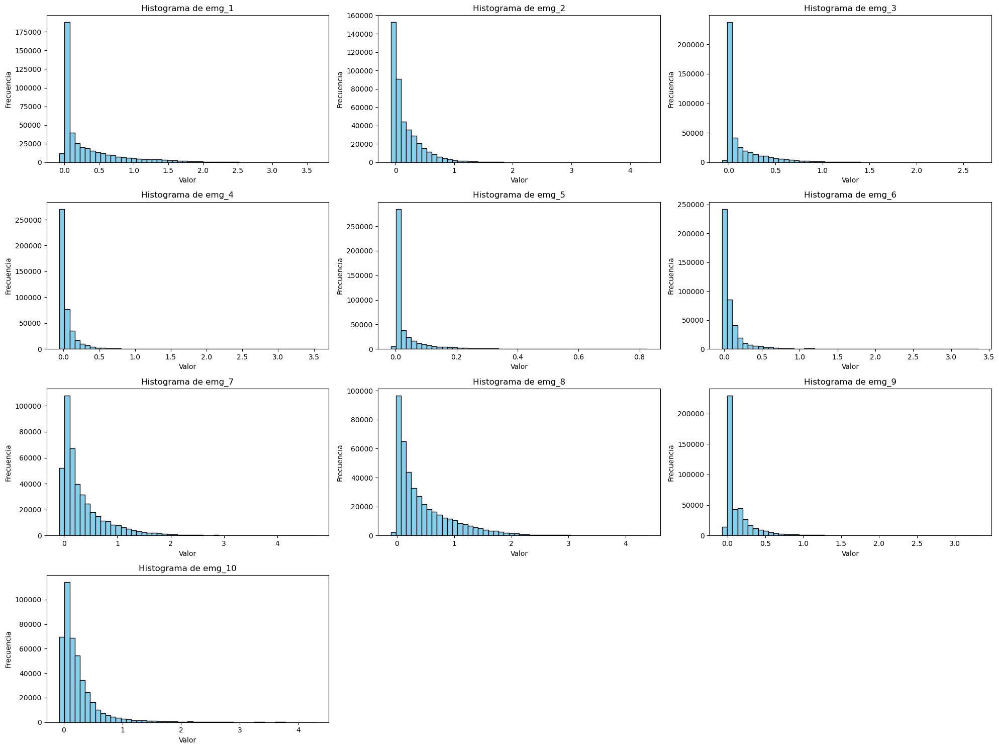

In [37]:
# Crear histogramas para cada canal EMG
plt.figure(figsize=(20, 15))

for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(4, 3, i)  # Crear subplots en una cuadrícula de 4x3
    plt.hist(df_all_users[column], bins=50, color='skyblue', edgecolor='black')
    plt.title(f'Histograma de {column}')
    plt.xlabel('Valor')
    plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

##### Diagrama de cajas y bigotes por canal

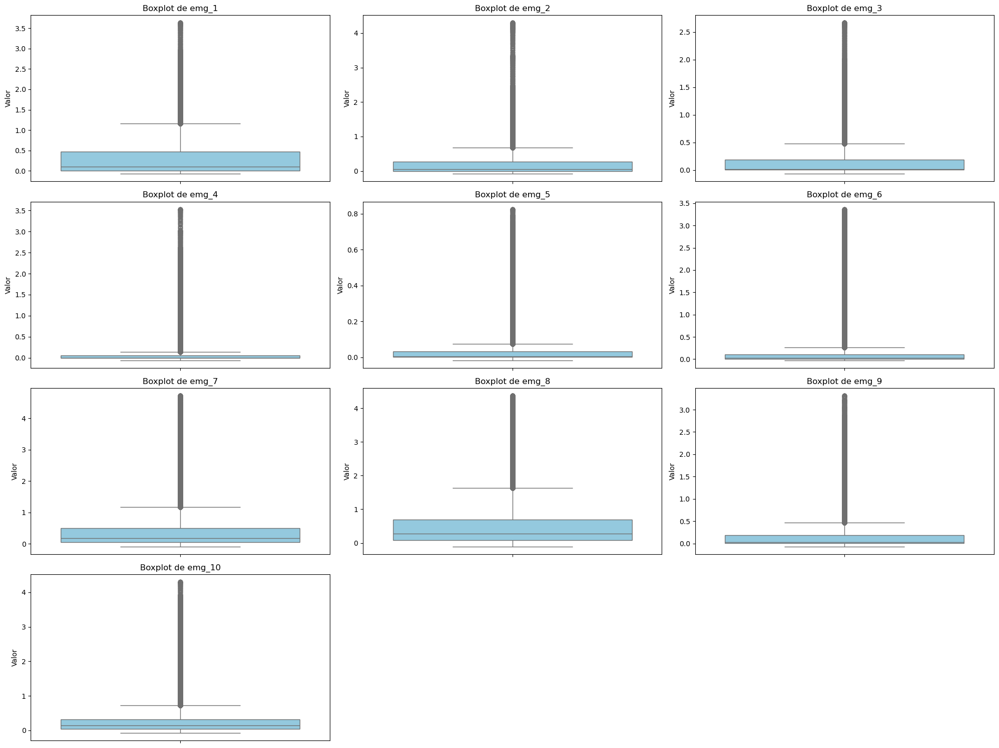

In [38]:
# Configuración de la figura
plt.figure(figsize=(20, 15))

# Crear un boxplot para cada canal EMG
for i, column in enumerate(numerical_columns, start=1):
    plt.subplot(4, 3, i)  # Crear subplots en una cuadrícula de 4x3
    sns.boxplot(data=df_all_users, y=column, color='skyblue')
    plt.title(f'Boxplot de {column}')
    plt.ylabel('Valor')

plt.tight_layout()
plt.show()

##### Gráficos de densidad por canal

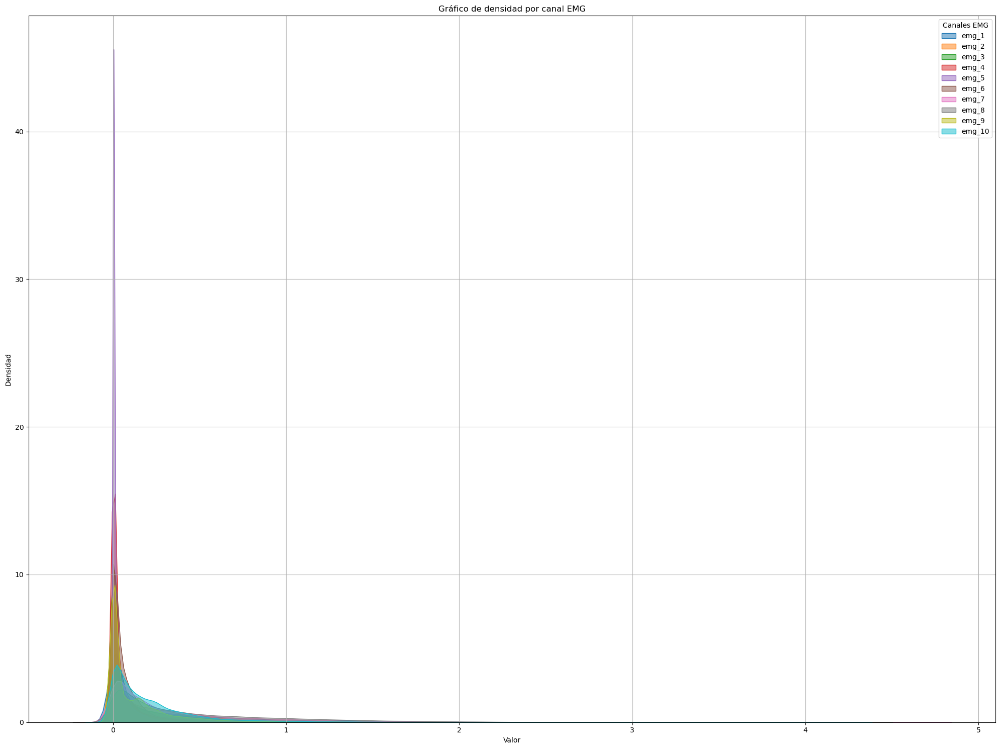

In [39]:
# Configuración de la figura
plt.figure(figsize=(20, 15))

# Crear un gráfico de densidad para cada canal EMG
for column in numerical_columns:
    sns.kdeplot(data=df_all_users, x=column, label=column, fill=True, alpha=0.5)

# Configuración de títulos y etiquetas
plt.title('Gráfico de densidad por canal EMG')
plt.xlabel('Valor')
plt.ylabel('Densidad')
plt.legend(title='Canales EMG', loc='upper right')
plt.grid(True)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

##### Mapa de correlaciones entre los canale

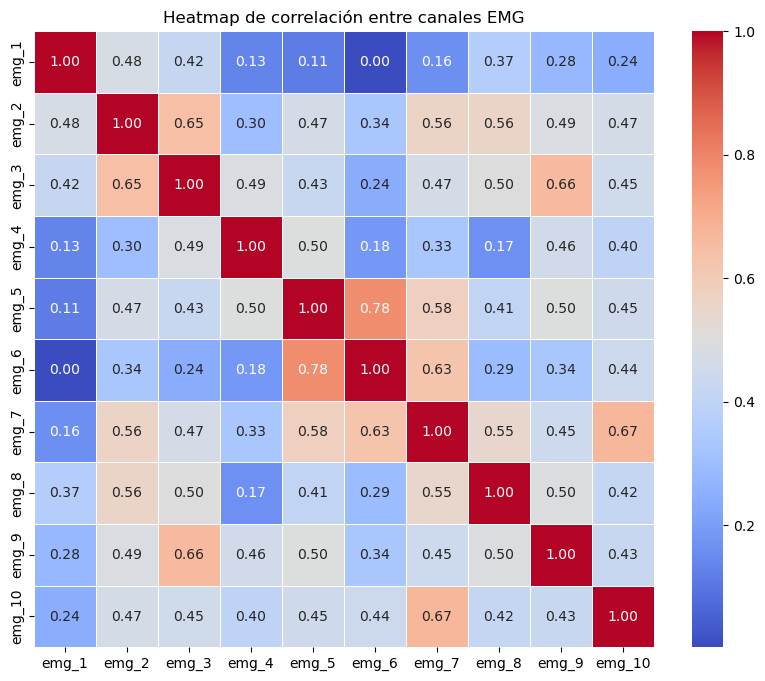

In [40]:
# Calcular la matriz de correlación entre los canales EMG
correlation_matrix = df_all_users[numerical_columns].corr()

# Crear el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap de correlación entre canales EMG')
plt.show()

#### FaceGrid por canal

Se crea un FacetGrid para dividir los datos por gesto (restimulus) para cada canal, obteniendo las subgráficas separadas por clase para mostrar cómo se comporta la señal EMG del canal actual para un valor de `restimulus`

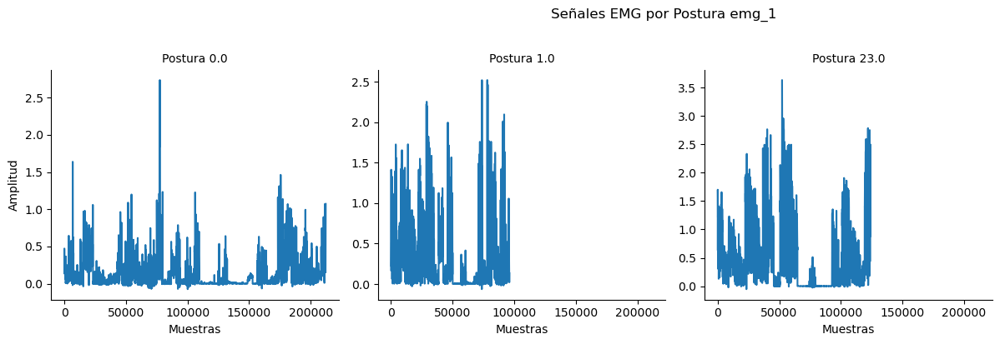

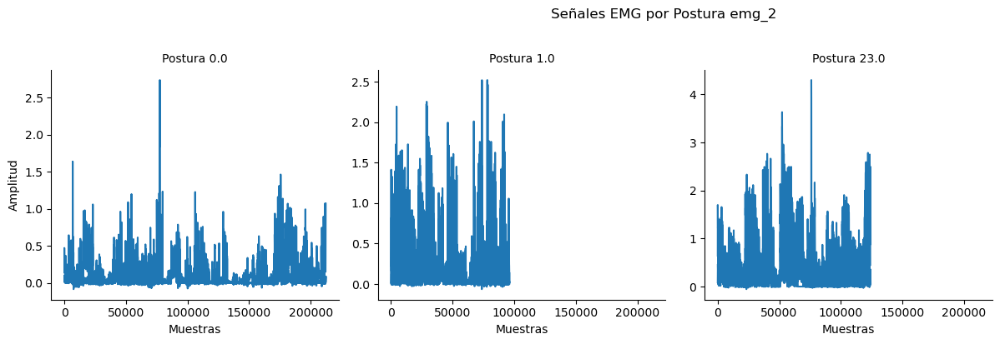

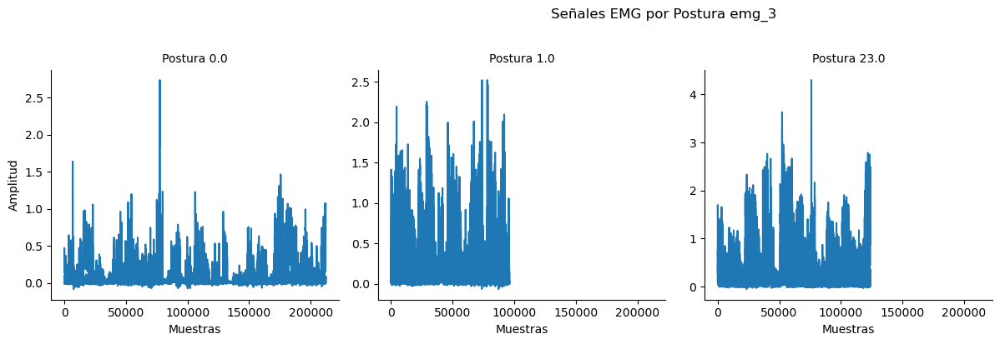

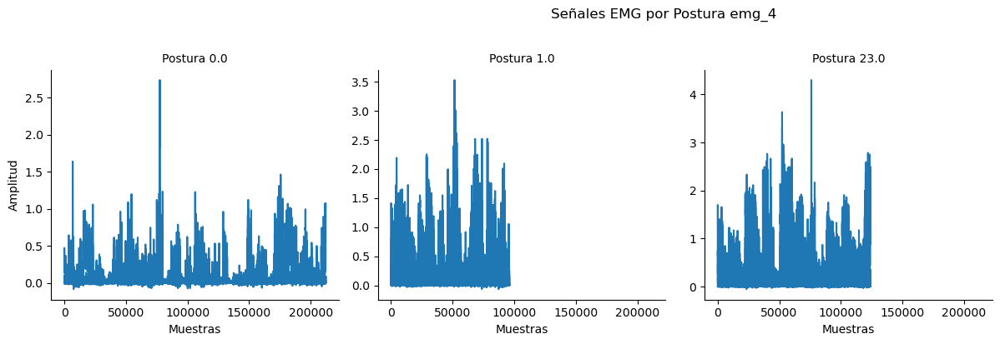

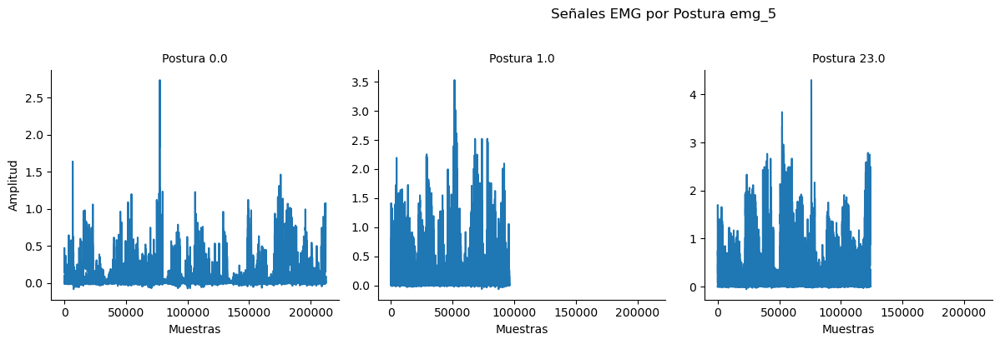

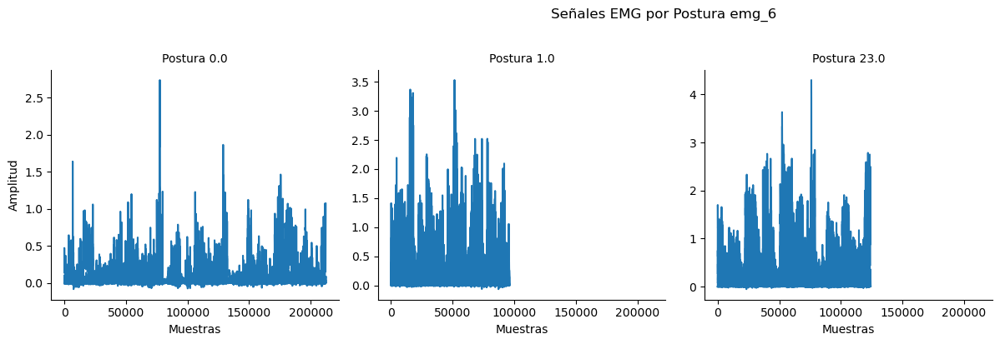

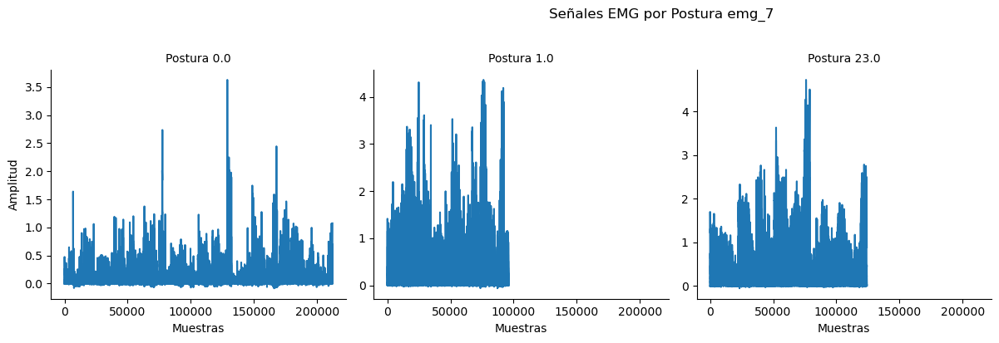

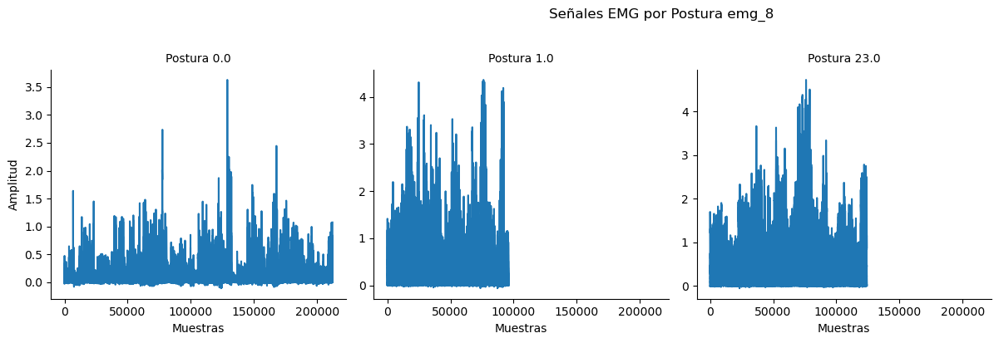

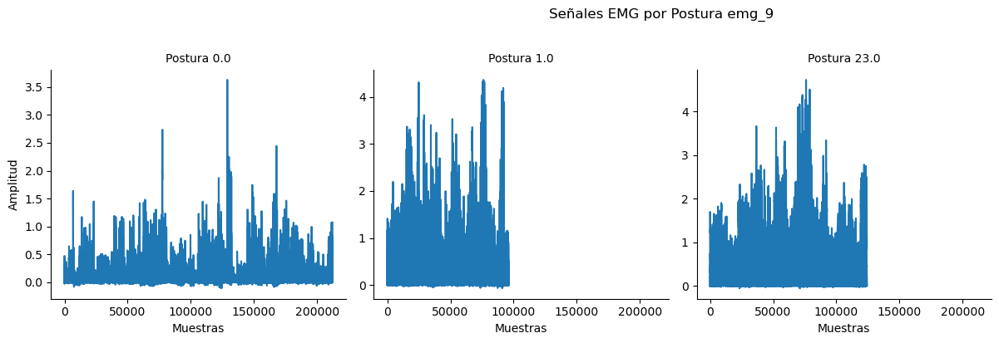

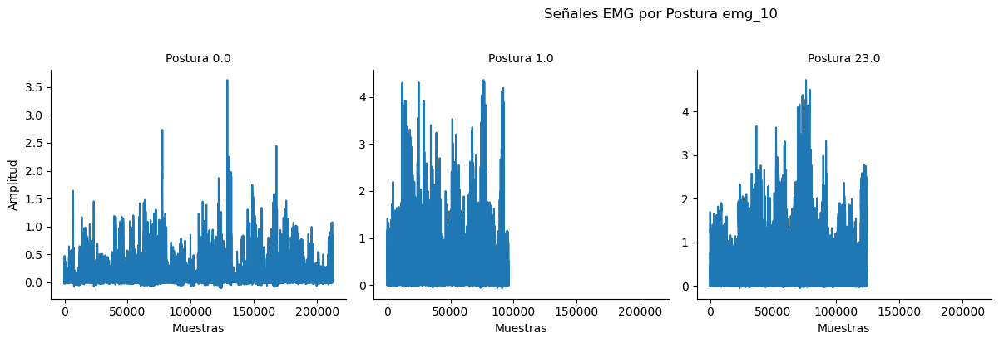

In [41]:
# Lista de columnas EMG
emg_columns = [f'emg_{i}' for i in range(1, 11)]


# Configuración del FacetGrid
g = sns.FacetGrid(df_all_users, col="restimulus", col_wrap=4, height=4, sharey=False)

# Dibujar cada señal EMG
for i, col in enumerate(emg_columns):
    # Trazar las señales EMG (por ejemplo, emg_10) en cada postura
    g.map(plt.plot, col)
    
    # Configuración de títulos y etiquetas
    g.set_titles("Postura {col_name}")
    g.set_axis_labels("Muestras", "Amplitud")
    g.fig.suptitle(f"Señales EMG por Postura {col}", y=1.02)
    
    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()

## Conclusiones

Al finalizar este notebook se logro.
* Hacer un EDA inicial de los datos filtrados pasa tener una idea de estos.